In [40]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split,GridSearchCV ,RandomizedSearchCV
from sklearn.metrics import accuracy_score,confusion_matrix,roc_auc_score,roc_curve
from ydata_profiling import ProfileReport

In [4]:
df=pd.read_csv(r'C:\Users\akshay\Downloads\winequality_red.csv')

In [611]:
df.head(50)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
5,7.4,0.660,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5
6,7.9,0.600,0.06,1.6,0.069,15.0,59.0,0.9964,3.30,0.46,9.4,5
7,7.3,0.650,0.00,1.2,0.065,15.0,21.0,0.9946,3.39,0.47,10.0,7
8,7.8,0.580,0.02,2.0,0.073,9.0,18.0,0.9968,3.36,0.57,9.5,7
9,7.5,0.500,0.36,6.1,0.071,17.0,102.0,0.9978,3.35,0.80,10.5,5


In [66]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [68]:
set(df.quality) #to know classes

{3, 4, 5, 6, 7, 8}

In [69]:
pf=ProfileReport(df)

In [70]:
pf

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [73]:
pf.to_file('reportdt.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [76]:
ls

 Volume in drive C is OS
 Volume Serial Number is 0C52-6CB9

 Directory of C:\Users\akshay

07-02-2023  10:49 AM    <DIR>          .
30-09-2022  09:41 PM    <DIR>          ..
08-05-2022  09:35 AM    <DIR>          .anaconda
07-02-2023  10:49 AM    <DIR>          .conda
24-12-2022  11:53 AM                25 .condarc
20-04-2022  01:20 PM    <DIR>          .continuum
04-02-2023  04:08 PM    <DIR>          .cufflinks
19-01-2023  06:27 PM                53 .git-for-windows-updater
06-02-2023  09:32 PM    <DIR>          .ipynb_checkpoints
23-04-2022  09:58 AM    <DIR>          .ipython
08-01-2023  10:15 PM    <DIR>          .jupyter
08-05-2022  12:39 PM    <DIR>          .matplotlib
08-01-2023  11:04 PM    <DIR>          .spyder-py3
18-09-2022  05:05 PM    <DIR>          .vscode
04-01-2023  07:37 PM    <DIR>          __pycache__
25-05-2021  10:54 AM    <DIR>          3D Objects
07-01-2023  11:02 AM                54 abc.log
03-02-2023  03:52 PM               589 admisiion_lr_model.pickle
22

In [78]:
x = df.drop(columns= 'quality')

In [79]:
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [80]:
y=df['quality']

In [81]:
y

0       5
1       5
2       5
3       6
4       5
       ..
1594    5
1595    6
1596    6
1597    5
1598    6
Name: quality, Length: 1599, dtype: int64

In [82]:
#if iorder change it will give conitnous multioutput error
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.25,random_state=300)

In [83]:
dt_model=DecisionTreeClassifier()#gini is by default

In [84]:
dt_model.fit(x_train,y_train)

DecisionTreeClassifier()

In [85]:
dt_model.predict(x_test)

array([5, 6, 6, 6, 6, 5, 5, 5, 5, 6, 4, 5, 6, 6, 5, 6, 6, 6, 5, 5, 5, 7,
       5, 6, 7, 6, 5, 5, 6, 5, 6, 7, 6, 5, 7, 6, 5, 6, 5, 5, 5, 6, 6, 4,
       6, 5, 5, 6, 6, 6, 6, 5, 6, 6, 5, 6, 7, 6, 6, 6, 6, 7, 6, 7, 6, 6,
       7, 5, 5, 6, 6, 5, 6, 7, 6, 4, 8, 5, 6, 5, 5, 6, 7, 7, 7, 6, 5, 6,
       5, 5, 5, 6, 5, 7, 5, 5, 7, 6, 5, 7, 7, 5, 6, 6, 6, 7, 5, 5, 5, 7,
       4, 5, 6, 6, 5, 6, 4, 5, 6, 4, 6, 5, 6, 6, 6, 7, 7, 5, 6, 6, 5, 5,
       5, 6, 6, 6, 6, 6, 6, 5, 6, 5, 6, 5, 6, 6, 5, 6, 6, 5, 5, 7, 7, 5,
       6, 6, 7, 5, 4, 7, 5, 5, 5, 6, 6, 6, 6, 5, 6, 6, 7, 5, 6, 6, 6, 7,
       5, 5, 5, 5, 6, 6, 6, 6, 5, 6, 6, 6, 5, 5, 5, 5, 6, 5, 5, 6, 6, 6,
       6, 5, 5, 5, 5, 5, 6, 7, 5, 6, 5, 5, 4, 7, 7, 5, 5, 6, 5, 7, 5, 5,
       5, 5, 5, 6, 6, 5, 5, 5, 5, 5, 5, 6, 5, 7, 6, 5, 6, 6, 6, 6, 5, 5,
       6, 6, 7, 6, 5, 5, 5, 6, 7, 5, 6, 6, 6, 7, 6, 6, 3, 7, 6, 6, 5, 4,
       6, 7, 6, 5, 6, 4, 5, 6, 6, 7, 6, 5, 5, 6, 5, 7, 7, 5, 5, 6, 5, 5,
       5, 5, 6, 5, 6, 5, 6, 6, 7, 6, 5, 7, 5, 6, 5,

In [86]:
dt_model.score(x_test,y_test)

0.61

In [87]:
#decision tree with entropy
dt_en=DecisionTreeClassifier( criterion='entropy')

In [88]:
dt_en.fit(x_train,y_train)

DecisionTreeClassifier(criterion='entropy')

In [89]:
dt_en.score(x_test,y_test)

0.6075

In [90]:
#dot file creation
#stored cdrive users akshay
outfile = open('dt_en.dot','w')
tree.export_graphviz(dt_en,out_file=outfile , feature_names=x.columns)

In [91]:
dir()

['DecisionTreeClassifier',
 'GridSearchCV',
 'In',
 'Out',
 'ProfileReport',
 '_',
 '_11',
 '_15',
 '_27',
 '_32',
 '_34',
 '_35',
 '_37',
 '_40',
 '_42',
 '_44',
 '_45',
 '_47',
 '_48',
 '_5',
 '_53',
 '_54',
 '_55',
 '_57',
 '_58',
 '_60',
 '_62',
 '_64',
 '_66',
 '_67',
 '_68',
 '_70',
 '_72',
 '_74',
 '_75',
 '_79',
 '_8',
 '_81',
 '_84',
 '_85',
 '_86',
 '_88',
 '_89',
 '__',
 '___',
 '__builtin__',
 '__builtins__',
 '__doc__',
 '__loader__',
 '__name__',
 '__package__',
 '__spec__',
 '_dh',
 '_exit_code',
 '_i',
 '_i1',
 '_i10',
 '_i11',
 '_i12',
 '_i13',
 '_i14',
 '_i15',
 '_i16',
 '_i17',
 '_i18',
 '_i19',
 '_i2',
 '_i20',
 '_i21',
 '_i22',
 '_i23',
 '_i24',
 '_i25',
 '_i26',
 '_i27',
 '_i28',
 '_i29',
 '_i3',
 '_i30',
 '_i31',
 '_i32',
 '_i33',
 '_i34',
 '_i35',
 '_i36',
 '_i37',
 '_i38',
 '_i39',
 '_i4',
 '_i40',
 '_i41',
 '_i42',
 '_i43',
 '_i44',
 '_i45',
 '_i46',
 '_i47',
 '_i48',
 '_i49',
 '_i5',
 '_i50',
 '_i51',
 '_i52',
 '_i53',
 '_i54',
 '_i55',
 '_i56',
 '_i57',
 '_i

In [92]:
ls

 Volume in drive C is OS
 Volume Serial Number is 0C52-6CB9

 Directory of C:\Users\akshay

07-02-2023  10:51 AM    <DIR>          .
30-09-2022  09:41 PM    <DIR>          ..
08-05-2022  09:35 AM    <DIR>          .anaconda
07-02-2023  10:52 AM    <DIR>          .conda
24-12-2022  11:53 AM                25 .condarc
20-04-2022  01:20 PM    <DIR>          .continuum
04-02-2023  04:08 PM    <DIR>          .cufflinks
19-01-2023  06:27 PM                53 .git-for-windows-updater
06-02-2023  09:32 PM    <DIR>          .ipynb_checkpoints
23-04-2022  09:58 AM    <DIR>          .ipython
08-01-2023  10:15 PM    <DIR>          .jupyter
08-05-2022  12:39 PM    <DIR>          .matplotlib
08-01-2023  11:04 PM    <DIR>          .spyder-py3
18-09-2022  05:05 PM    <DIR>          .vscode
04-01-2023  07:37 PM    <DIR>          __pycache__
25-05-2021  10:54 AM    <DIR>          3D Objects
07-01-2023  11:02 AM                54 abc.log
03-02-2023  03:52 PM               589 admisiion_lr_model.pickle
22

In [62]:
pwd


'C:\\Users\\akshay'

In [93]:
import  matplotlib.pyplot as plt
from sklearn import tree
%matplotlib inline

[Text(551.0793121755546, 1065.4560000000001, 'X[10] <= 10.15\ngini = 0.638\nsamples = 1199\nvalue = [5, 41, 512, 487, 139, 15]'),
 Text(295.28953810759793, 1021.9680000000001, 'X[1] <= 0.548\ngini = 0.506\nsamples = 594\nvalue = [3, 20, 374, 184, 12, 1]'),
 Text(172.81146767343088, 978.48, 'X[6] <= 60.5\ngini = 0.554\nsamples = 264\nvalue = [0, 7, 134, 114, 8, 1]'),
 Text(82.29117508258614, 934.9920000000001, 'X[9] <= 0.585\ngini = 0.56\nsamples = 178\nvalue = [0, 5, 68, 96, 8, 1]'),
 Text(38.97310051911279, 891.504, 'X[5] <= 8.5\ngini = 0.528\nsamples = 55\nvalue = [0, 4, 33, 18, 0, 0]'),
 Text(21.06654082114205, 848.0160000000001, 'X[10] <= 9.85\ngini = 0.265\nsamples = 20\nvalue = [0, 1, 17, 2, 0, 0]'),
 Text(12.63992449268523, 804.528, 'X[9] <= 0.435\ngini = 0.105\nsamples = 18\nvalue = [0, 0, 17, 1, 0, 0]'),
 Text(8.42661632845682, 761.0400000000001, 'X[1] <= 0.44\ngini = 0.5\nsamples = 2\nvalue = [0, 0, 1, 1, 0, 0]'),
 Text(4.21330816422841, 717.552, 'gini = 0.0\nsamples = 1\nval

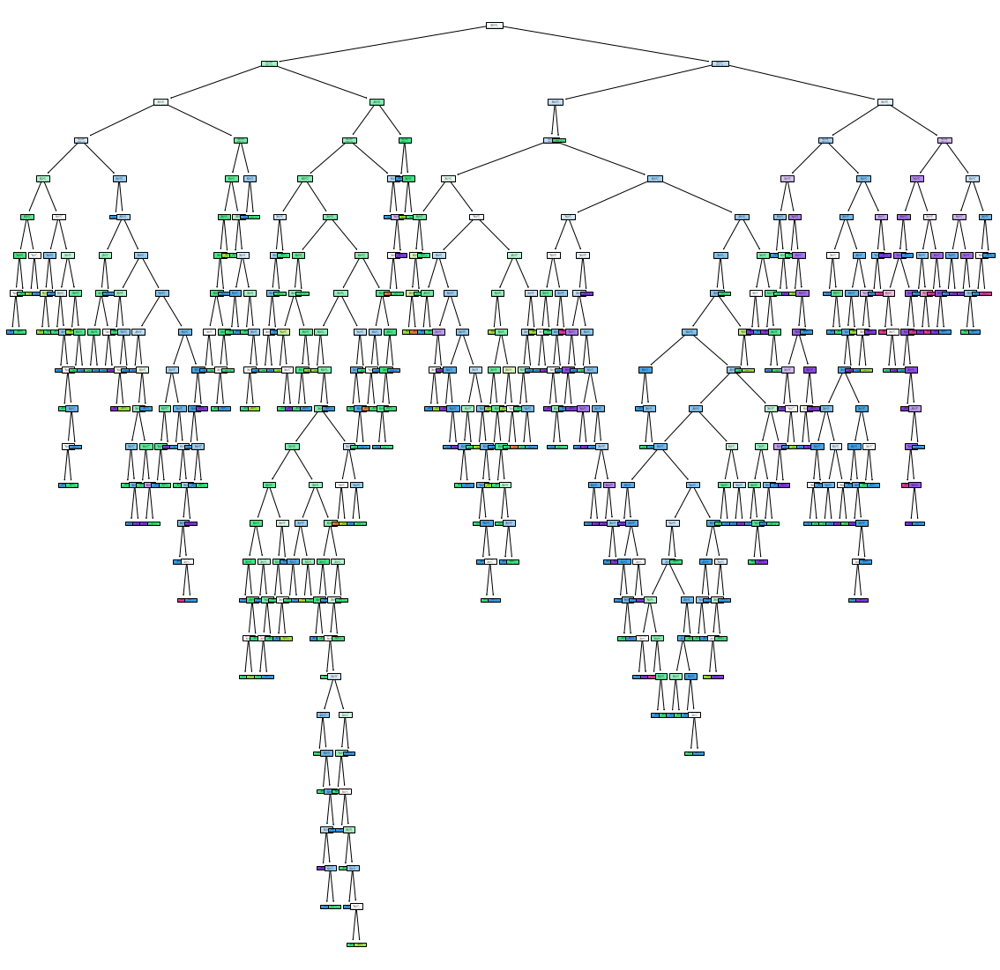

In [96]:
plt.figure(figsize=(20,20)) #plot tree
tree.plot_tree(dt_model,filled=True)#filed for colour

In [131]:
#few data is taken from dataset to understand 

In [331]:
df1=df.head(500)

In [332]:
x1=df1.drop(columns='quality')

In [333]:
y1=df1.quality

In [334]:
dt_model2=DecisionTreeClassifier()


In [335]:
dt_model2.fit(x1,y1)

DecisionTreeClassifier()

In [336]:
set(y1)

{3, 4, 5, 6, 7, 8}

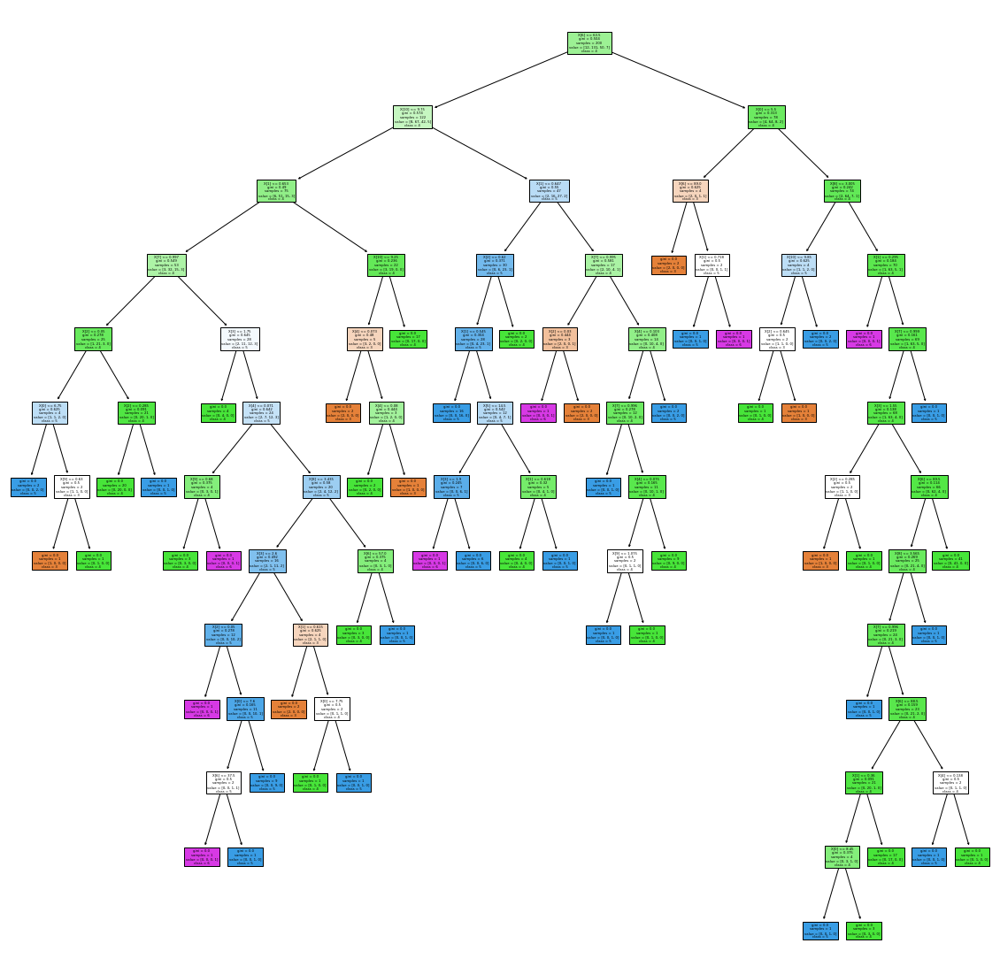

In [337]:
plt.figure(figsize=(20,20)) #plot tree
tree.plot_tree(dt_model1,filled=True,class_names=[str(i) for i in set(y1)]) #filed for colour
plt.savefig('dt_model') #save to local disk c users akshay
#values [1,21,5,3] #no.values from Y i.e classes 4,5,6,7
#x[1] column has less gini(calclated using y) out of all feature colum so select as root node
#after that it divided on the basis of value lesser than x[2] and >x[2]
# in next stage,gini for all feature calculated with divided data i.e 26 for x[2]< and 4 for x[2]>
# and conditon is decided how further tree is formed using minimum gini
#actual x[6] should be written in the bottom of the box it is confusing
#the tree formation goes on untill gini=0

#### but how x[2]<0.42 condition decided? Random value or soometimes mean

In [338]:
import sklearn
sklearn.__version__ #above 24 version dt works

'0.24.2'

In [339]:
df1

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
495,10.7,0.35,0.53,2.6,0.070,5.0,16.0,0.9972,3.15,0.65,11.0,8
496,7.8,0.52,0.25,1.9,0.081,14.0,38.0,0.9984,3.43,0.65,9.0,6
497,7.2,0.34,0.32,2.5,0.090,43.0,113.0,0.9966,3.32,0.79,11.1,5
498,10.7,0.35,0.53,2.6,0.070,5.0,16.0,0.9972,3.15,0.65,11.0,8


In [340]:
dt_model2.predict(x1)

array([5, 5, 5, 6, 5, 5, 5, 7, 7, 5, 5, 5, 5, 5, 5, 5, 7, 5, 4, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 6, 5, 6, 5, 6, 5, 6, 6, 7, 4, 5, 5, 4, 6, 5,
       5, 4, 5, 5, 5, 5, 5, 6, 6, 5, 6, 5, 5, 5, 5, 6, 5, 5, 7, 5, 5, 5,
       5, 5, 5, 6, 6, 5, 5, 4, 5, 5, 5, 6, 5, 4, 5, 5, 5, 5, 6, 5, 6, 5,
       5, 5, 5, 6, 5, 5, 4, 6, 5, 5, 5, 6, 6, 6, 6, 5, 5, 5, 5, 5, 6, 5,
       5, 5, 5, 6, 5, 6, 6, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5, 5, 7, 5, 5, 5,
       5, 6, 6, 5, 5, 5, 5, 5, 5, 5, 6, 5, 6, 5, 5, 5, 6, 6, 6, 4, 5, 5,
       5, 5, 5, 5, 5, 6, 5, 4, 6, 5, 5, 5, 5, 4, 6, 5, 4, 6, 6, 6, 5, 5,
       5, 6, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 6,
       7, 4, 7, 5, 5, 5, 6, 7, 7, 5, 5, 7, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5,
       6, 5, 5, 6, 4, 6, 6, 5, 6, 5, 7, 6, 6, 5, 6, 6, 6, 6, 6, 6, 5, 6,
       6, 7, 7, 6, 5, 5, 6, 6, 6, 6, 5, 5, 6, 5, 5, 5, 5, 7, 5, 4, 5, 5,
       5, 7, 4, 8, 6, 6, 6, 6, 5, 5, 5, 6, 6, 6, 8, 7, 6, 7, 5, 7, 5, 5,
       6, 6, 7, 5, 7, 5, 6, 6, 6, 5, 5, 5, 5, 5, 6,

In [341]:
dt_model2.score(x1,y1)

1.0

In [342]:
dt_model2.score(x_test,y_test) #accuracy with model1 test is very less than train so overfit 
#so prune it

0.5825

In [343]:
# after tree x[1]<=0.415 majority of tree is having class 5 so unnnecessary complexity 
# to avoid that we PRUNE THE data 

#in this case post pruning 


In [344]:
path=dt_model2.cost_complexity_pruning_path(x1,y1)

In [345]:
path #ccp=cost complexity path

{'ccp_alphas': array([0.        , 0.00175   , 0.00181818, 0.00184615, 0.00185   ,
        0.00188235, 0.00192308, 0.002     , 0.002     , 0.002     ,
        0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
        0.002     , 0.002     , 0.00247552, 0.00261111, 0.00262769,
        0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
        0.00266667, 0.00266667, 0.00266667, 0.00272222, 0.00285714,
        0.003     , 0.003     , 0.003     , 0.003     , 0.00304762,
        0.00305051, 0.00308418, 0.00325   , 0.00328205, 0.00333333,
        0.00333333, 0.00334032, 0.00336606, 0.00342857, 0.00343316,
        0.0035    , 0.0035    , 0.0036    , 0.00363636, 0.00373333,
        0.00373809, 0.0038    , 0.0038237 , 0.004     , 0.00404444,
        0.00428571, 0.00428571, 0.00437662, 0.00462338, 0.00465709,
        0.00466667, 0.0048    , 0.00487179, 0.00504242, 0.00508235,
        0.00509091, 0.00510606, 0.00516667, 0.00568485, 0.00589394,
        0.00656364, 0.00671079, 0.

In [346]:
#extract ccp values
ccp_alpha=path['ccp_alphas']

In [347]:
ccp_alpha

array([0.        , 0.00175   , 0.00181818, 0.00184615, 0.00185   ,
       0.00188235, 0.00192308, 0.002     , 0.002     , 0.002     ,
       0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
       0.002     , 0.002     , 0.00247552, 0.00261111, 0.00262769,
       0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
       0.00266667, 0.00266667, 0.00266667, 0.00272222, 0.00285714,
       0.003     , 0.003     , 0.003     , 0.003     , 0.00304762,
       0.00305051, 0.00308418, 0.00325   , 0.00328205, 0.00333333,
       0.00333333, 0.00334032, 0.00336606, 0.00342857, 0.00343316,
       0.0035    , 0.0035    , 0.0036    , 0.00363636, 0.00373333,
       0.00373809, 0.0038    , 0.0038237 , 0.004     , 0.00404444,
       0.00428571, 0.00428571, 0.00437662, 0.00462338, 0.00465709,
       0.00466667, 0.0048    , 0.00487179, 0.00504242, 0.00508235,
       0.00509091, 0.00510606, 0.00516667, 0.00568485, 0.00589394,
       0.00656364, 0.00671079, 0.0067591 , 0.00688352, 0.00688

In [355]:
dt_model2=[]
for ccp in ccp_alpha:
    dt_m=DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m.fit(x1,y1)
    dt_model2.append(dt_m)

In [356]:
dt_model2 #multiple dt model with ccp values
#select model 

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.00175),
 DecisionTreeClassifier(ccp_alpha=0.0018181818181818184),
 DecisionTreeClassifier(ccp_alpha=0.0018461538461538455),
 DecisionTreeClassifier(ccp_alpha=0.0018500000000000005),
 DecisionTreeClassifier(ccp_alpha=0.001882352941176471),
 DecisionTreeClassifier(ccp_alpha=0.0019230769230769243),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.0024755244755244737),
 DecisionTreeClassifier(ccp_alpha=0.0026111111111111114),
 DecisionTreeClassifier(ccp_alpha=0.0026276923076923083),
 DecisionTreeClassifier(ccp_alpha=0.0026666666

In [358]:
train_score=[i.score(x1,y1) for i in dt_model2]

In [359]:
test_score=[i.score(x_test,y_test) for i in dt_model2]

In [360]:
print(train_score,test_score)

[1.0, 0.996, 0.994, 0.994, 0.992, 0.99, 0.988, 0.96, 0.964, 0.96, 0.962, 0.966, 0.96, 0.96, 0.962, 0.964, 0.962, 0.958, 0.95, 0.944, 0.93, 0.928, 0.932, 0.928, 0.93, 0.932, 0.93, 0.928, 0.928, 0.922, 0.912, 0.918, 0.92, 0.914, 0.912, 0.91, 0.914, 0.904, 0.902, 0.896, 0.9, 0.896, 0.896, 0.89, 0.886, 0.88, 0.886, 0.882, 0.878, 0.876, 0.872, 0.872, 0.866, 0.856, 0.854, 0.848, 0.846, 0.852, 0.838, 0.824, 0.818, 0.814, 0.824, 0.804, 0.802, 0.794, 0.79, 0.786, 0.784, 0.78, 0.776, 0.776, 0.772, 0.768, 0.762, 0.758, 0.742, 0.728, 0.718, 0.698, 0.69, 0.682, 0.676, 0.676, 0.636, 0.596, 0.596, 0.596, 0.558, 0.558] [0.595, 0.5875, 0.5775, 0.5975, 0.58, 0.5875, 0.6025, 0.585, 0.6025, 0.5925, 0.5875, 0.595, 0.585, 0.595, 0.595, 0.61, 0.605, 0.5775, 0.5775, 0.6, 0.59, 0.58, 0.575, 0.585, 0.59, 0.5875, 0.5825, 0.5875, 0.575, 0.5925, 0.5675, 0.5725, 0.5675, 0.5825, 0.565, 0.5625, 0.5725, 0.5675, 0.575, 0.56, 0.58, 0.59, 0.555, 0.5875, 0.5775, 0.5825, 0.5675, 0.575, 0.5825, 0.565, 0.5775, 0.5775, 0.59, 

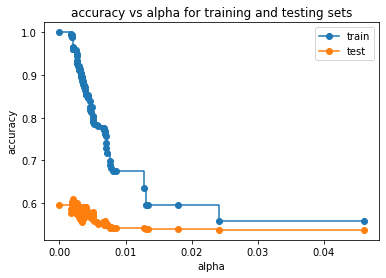

In [361]:
fig,ax=plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel('accuracy')
ax.set_title("accuracy vs alpha for training and testing sets")
ax.plot(ccp_alpha,train_score,marker='o',label="train",drawstyle="steps-post")

ax.plot(ccp_alpha,test_score,marker='o',label="test",drawstyle="steps-post")
ax.legend()
plt.show()

In [362]:
#difference is more between train and test
#so modelis not good and why it hapens training data was smaller and test was larger
#but ur model must be robust in any situation with good accuracy as well 
# sochecked for df1=df.head(200),df1.head(500) difference gets minimised
#this solution is scenario based not applicable every time 

In [364]:
#create model with ccp 0.014 see plot. after our experiment of adding data points 30 to 500 in df1 plot gets closer 
#u can use any ccp value from 0-0.04 to check for best model
dt_model_ccp=DecisionTreeClassifier(random_state=0,ccp_alpha=0.014)
dt_model_ccp.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.014, random_state=0)

[Text(558.0, 906.0, 'X[10] <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]'),
 Text(279.0, 543.6, 'X[6] <= 62.5\ngini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]'),
 Text(139.5, 181.19999999999993, 'gini = 0.576\nsamples = 169\nvalue = [1, 9, 91, 61, 6, 1]'),
 Text(418.5, 181.19999999999993, 'gini = 0.271\nsamples = 90\nvalue = [0, 3, 76, 11, 0, 0]'),
 Text(837.0, 543.6, 'X[9] <= 0.545\ngini = 0.657\nsamples = 241\nvalue = [0, 4, 72, 112, 46, 7]'),
 Text(697.5, 181.19999999999993, 'gini = 0.408\nsamples = 32\nvalue = [0, 2, 24, 5, 1, 0]'),
 Text(976.5, 181.19999999999993, 'gini = 0.638\nsamples = 209\nvalue = [0, 2, 48, 107, 45, 7]')]

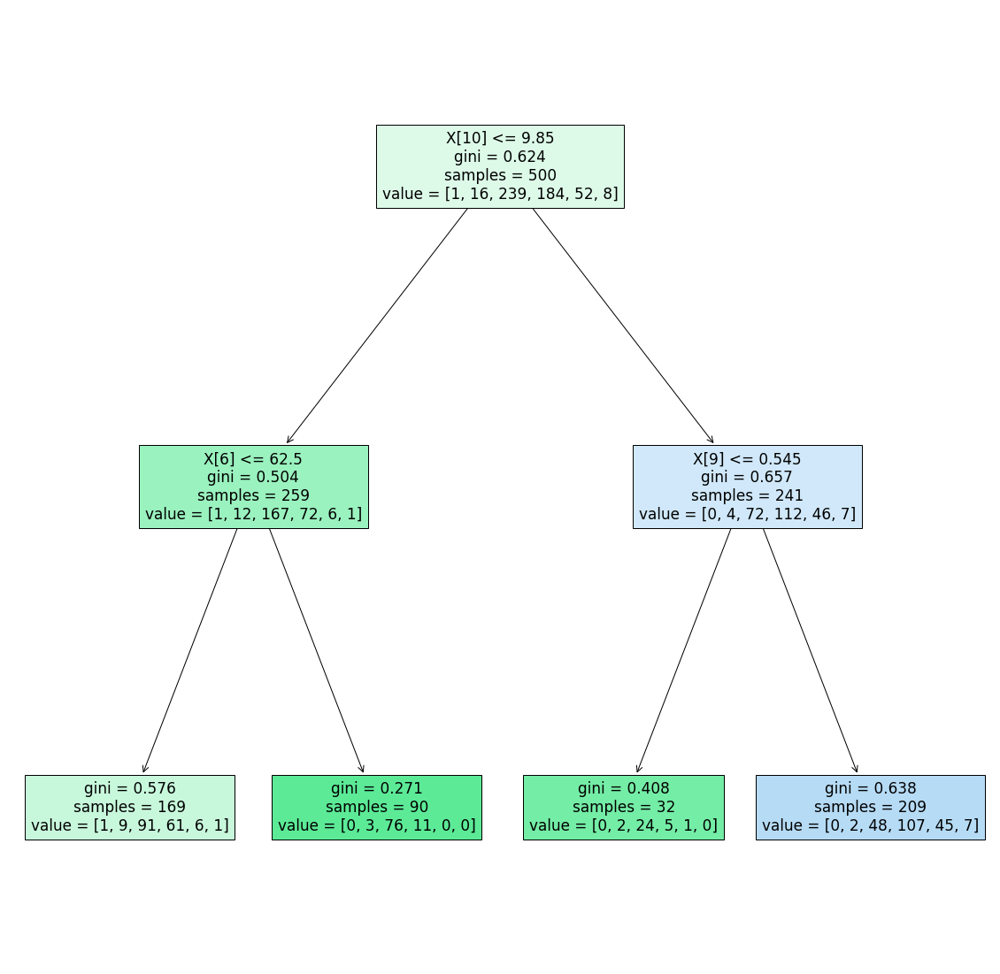

In [365]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_ccp,filled=True)

In [366]:
dt_model_ccp.score(x1,y1)

0.596

In [367]:
dt_model_ccp.score(x_test,y_test)

0.54

In [370]:
dt_model_ccp=DecisionTreeClassifier(random_state=0,ccp_alpha=0.01)
dt_model_ccp.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.01, random_state=0)

[Text(558.0, 996.6, 'X[10] <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]'),
 Text(372.0, 815.4000000000001, 'X[6] <= 62.5\ngini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]'),
 Text(279.0, 634.2, 'X[2] <= 0.415\ngini = 0.576\nsamples = 169\nvalue = [1, 9, 91, 61, 6, 1]'),
 Text(186.0, 453.0, 'X[10] <= 9.05\ngini = 0.525\nsamples = 131\nvalue = [0, 8, 81, 39, 3, 0]'),
 Text(93.0, 271.79999999999995, 'gini = 0.403\nsamples = 12\nvalue = [0, 2, 1, 9, 0, 0]'),
 Text(279.0, 271.79999999999995, 'gini = 0.481\nsamples = 119\nvalue = [0, 6, 80, 30, 3, 0]'),
 Text(372.0, 453.0, 'gini = 0.587\nsamples = 38\nvalue = [1, 1, 10, 22, 3, 1]'),
 Text(465.0, 634.2, 'gini = 0.271\nsamples = 90\nvalue = [0, 3, 76, 11, 0, 0]'),
 Text(744.0, 815.4000000000001, 'X[9] <= 0.545\ngini = 0.657\nsamples = 241\nvalue = [0, 4, 72, 112, 46, 7]'),
 Text(651.0, 634.2, 'gini = 0.408\nsamples = 32\nvalue = [0, 2, 24, 5, 1, 0]'),
 Text(837.0, 634.2, 'X[9] <= 0.705\ngini = 0.638\nsample

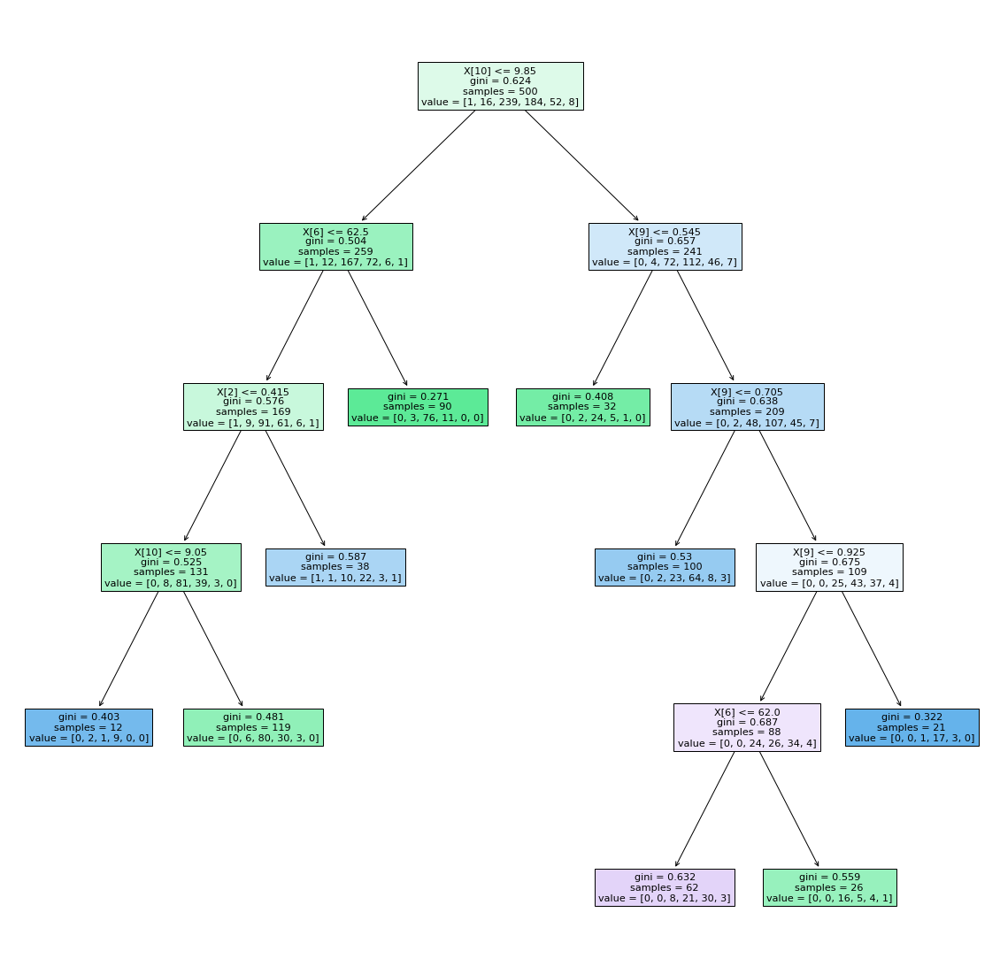

In [371]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_ccp,filled=True)

In [372]:
dt_model_ccp.score(x1,y1)

0.676

In [373]:
dt_model_ccp.score(x_test,y_test)

0.5425

we need to find best possible parameter at a time rather going one by one with ccp and checking accuracy differences 
as we did above so best way is cross validation 

In [374]:
DecisionTreeClassifier()

DecisionTreeClassifier()

# Hypertuning with gridsearch cv

In [382]:
#paramter created for grid search cross validation
grid_param={'criterion':['gini','entropy'],
          "splitter":['best','random'],
          "max_depth":range(2,40,1),
          "min_samples_split":range(2,10,1),
          "min_samples_leaf":range(1,10,1)
          }

In [383]:
grid_ccp=GridSearchCV(estimator=dt_model_ccp,param_grid=grid_param,cv=5,n_jobs=-1)
#estimator=any model u build above
#cv cross validation =5 which divides data into 5 datasets to do validate
# cv divides data check grid_param to on every divided dataset 
# cv out of which any 4 for train and 1 for test in every iteration
#n jobs=-1 engage all processor to do task 

In [381]:
grid_ccp.fit(x1,y1) #takes time

C:\Users\akshay\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:666: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"


GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(ccp_alpha=0.01, random_state=0),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 40),
                         'min_samples_leaf': range(1, 10),
                         'min_samples_split': range(2, 10),
                         'splitter': ['best', 'random']})

In [419]:
#get best parameter out of above 
grid_ccp.best_params_ #actually available but check why error is giving

AttributeError: 'GridSearchCV' object has no attribute 'best_params_'

In [393]:
dtt_cpp_new=DecisionTreeClassifier(criterion='entropy',max_depth=15,min_samples_leaf=2,splitter='random')

In [395]:
dtt_cpp_new.fit(x1,y1)

DecisionTreeClassifier(criterion='entropy', max_depth=15, min_samples_leaf=2,
                       splitter='random')

In [396]:
dtt_cpp_new.score(x1,y1)

0.878

In [397]:
dtt_cpp_new.score(x_test,y_test)

0.5675

In [411]:
#same like gridsearch with random approach
grid_ccp=RandomizedSearchCV(estimator=dt_model_ccp,param_distribution=[#give parameters],cv=5,n_jobs=-1)

SyntaxError: unexpected EOF while parsing (Temp/ipykernel_43828/3204052478.py, line 2)

 hyper parameter tunning doesnt guarantee you good accuracy always
 may be due to same dataset we are using for cv 

 so do experiment with hyperparameter 
 in this we can increase cv =10,15.. likewise

In [412]:
grid_ccp1=GridSearchCV(estimator=dt_model_ccp,param_grid=grid_param,cv=10,n_jobs=-1)

In [414]:
grid_ccp1.fit(x1,y1)

C:\Users\akshay\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:666: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=10.
  warnings.warn(("The least populated class in y has only %d"


GridSearchCV(cv=10,
             estimator=DecisionTreeClassifier(ccp_alpha=0.01, random_state=0),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 40),
                         'min_samples_leaf': range(1, 10),
                         'min_samples_split': range(2, 10),
                         'splitter': ['best', 'random']})

In [415]:
grid_ccp1.best_params_ #parameters get here put thatinto below

{'criterion': 'entropy',
 'max_depth': 11,
 'min_samples_leaf': 5,
 'min_samples_split': 2,
 'splitter': 'random'}

In [420]:
dtt_cpp_new1=DecisionTreeClassifier(criterion= 'entropy',max_depth= 11,min_samples_leaf= 5,min_samples_split= 2,splitter= 'random')

In [421]:
dtt_cpp_new1.fit(x1,y1)

DecisionTreeClassifier(criterion='entropy', max_depth=11, min_samples_leaf=5,
                       splitter='random')

In [423]:
dtt_cpp_new1.score(x_test,y_test)

0.5725

In [425]:
pred=dtt_cpp_new1.predict(x_train)

In [426]:
confusion_matrix(y_train,pred)

array([[  0,   0,   5,   0,   0,   0],
       [  0,   0,  23,  18,   0,   0],
       [  0,   0, 368, 134,  10,   0],
       [  0,   0, 177, 277,  33,   0],
       [  0,   0,  35,  75,  29,   0],
       [  0,   0,   3,   6,   6,   0]], dtype=int64)

# Bagging
Decision tree


In [431]:
from sklearn.ensemble import BaggingClassifier

In [432]:
X_train,x_test,y_train,y_test=train_test_split(x,y,random_state=0)

In [436]:
#bagging with base algorithm decision tree by default its decision tree inside but u can use any algo
bag_dt= BaggingClassifier(DecisionTreeClassifier(),n_estimators=10) #n-estimator(decision maker)how many trees inside bag

In [438]:
bag_dt.fit(x_train,y_train)

BaggingClassifier(base_estimator=DecisionTreeClassifier())

In [439]:
bag_dt.predict(x_test)

array([5, 5, 5, 6, 5, 6, 6, 5, 6, 5, 5, 5, 5, 5, 5, 6, 5, 6, 5, 5, 6, 7,
       5, 6, 6, 5, 5, 6, 5, 5, 5, 7, 6, 5, 6, 6, 6, 5, 5, 6, 4, 6, 8, 6,
       6, 6, 6, 5, 6, 6, 5, 5, 6, 6, 6, 5, 5, 6, 6, 5, 5, 6, 5, 6, 5, 6,
       5, 6, 6, 7, 6, 5, 7, 6, 7, 5, 6, 6, 7, 5, 5, 5, 6, 5, 5, 5, 6, 4,
       8, 5, 5, 6, 7, 4, 6, 6, 5, 5, 6, 5, 6, 5, 6, 6, 5, 5, 5, 6, 5, 7,
       6, 6, 5, 5, 6, 7, 6, 5, 5, 5, 5, 5, 7, 6, 6, 5, 5, 4, 6, 5, 5, 6,
       6, 6, 5, 6, 6, 6, 5, 5, 6, 6, 6, 6, 5, 6, 5, 5, 6, 5, 7, 6, 6, 5,
       5, 7, 5, 7, 6, 5, 5, 5, 6, 6, 7, 7, 6, 6, 5, 6, 5, 6, 5, 6, 5, 5,
       7, 6, 6, 6, 4, 5, 8, 5, 5, 6, 5, 6, 5, 5, 5, 6, 6, 5, 5, 5, 5, 5,
       4, 7, 6, 5, 4, 7, 6, 6, 6, 5, 5, 7, 6, 5, 6, 6, 6, 6, 5, 4, 7, 5,
       5, 5, 5, 5, 6, 5, 6, 6, 5, 6, 5, 6, 5, 6, 6, 6, 5, 6, 5, 7, 6, 6,
       5, 5, 6, 6, 5, 7, 5, 6, 6, 7, 6, 5, 5, 6, 6, 6, 6, 6, 6, 5, 5, 6,
       6, 6, 6, 6, 5, 6, 6, 5, 6, 5, 5, 6, 6, 6, 6, 6, 5, 5, 5, 6, 5, 5,
       5, 5, 6, 5, 5, 5, 5, 5, 6, 5, 6, 7, 5, 5, 5,

In [440]:
bag_dt.base_estimator_

DecisionTreeClassifier()

In [441]:
bag_dt.estimator_params

()

knn


In [443]:
from sklearn.neighbors import kNeighborsClassifier

ImportError: cannot import name 'kNeighborsClassifier' from 'sklearn.neighbors' (C:\Users\akshay\anaconda3\lib\site-packages\sklearn\neighbors\__init__.py)

In [445]:
 from sklearn.neighbors import KNeighborsClassifier

In [447]:
bag_knn=BaggingClassifier(KNeighborsClassifier(6),n_estimators=10)

In [449]:
bag_knn.fit(x_train,y_train)

BaggingClassifier(base_estimator=KNeighborsClassifier(n_neighbors=6))

In [450]:
bag_knn.predict(x_test)

array([5, 5, 6, 5, 5, 5, 6, 6, 6, 5, 5, 5, 5, 5, 6, 6, 5, 6, 6, 5, 6, 6,
       5, 6, 7, 6, 5, 5, 5, 5, 5, 6, 6, 5, 6, 5, 6, 5, 5, 5, 6, 6, 5, 5,
       5, 5, 6, 5, 6, 6, 6, 6, 6, 5, 5, 6, 5, 5, 6, 5, 5, 5, 6, 6, 5, 6,
       6, 6, 5, 5, 5, 6, 5, 5, 6, 5, 5, 8, 5, 7, 6, 5, 5, 5, 5, 7, 5, 6,
       5, 7, 5, 6, 6, 5, 6, 5, 6, 5, 6, 5, 5, 5, 7, 5, 5, 5, 5, 6, 5, 5,
       6, 5, 5, 5, 6, 5, 5, 5, 5, 5, 6, 6, 7, 6, 6, 5, 5, 6, 6, 6, 6, 6,
       5, 5, 5, 6, 6, 6, 6, 5, 6, 6, 6, 6, 5, 5, 5, 6, 5, 5, 5, 5, 6, 5,
       5, 6, 6, 5, 6, 6, 5, 5, 5, 6, 5, 5, 6, 7, 6, 6, 5, 5, 5, 6, 5, 5,
       5, 5, 6, 6, 6, 5, 5, 5, 6, 5, 5, 7, 5, 5, 6, 6, 6, 5, 6, 5, 5, 6,
       5, 5, 5, 5, 6, 7, 6, 6, 5, 6, 6, 6, 6, 6, 6, 6, 5, 6, 5, 5, 6, 5,
       5, 5, 5, 6, 5, 6, 6, 6, 6, 6, 8, 6, 6, 6, 6, 6, 5, 6, 5, 7, 5, 5,
       5, 5, 6, 7, 5, 6, 6, 6, 6, 6, 5, 6, 5, 6, 6, 6, 6, 6, 5, 5, 5, 5,
       5, 6, 5, 6, 7, 6, 5, 5, 7, 5, 5, 6, 6, 6, 6, 5, 6, 6, 5, 5, 6, 6,
       5, 5, 6, 5, 5, 5, 5, 5, 6, 6, 6, 5, 6, 6, 5,

In [452]:
 from sklearn.ensemble import RandomForestClassifier

In [464]:
rf=RandomForestClassifier(n_estimators=5)

In [465]:
rf.fit(x_train,y_train)

RandomForestClassifier(n_estimators=5)

In [466]:
rf.predict(x_test)

array([5, 7, 7, 6, 5, 5, 6, 6, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 5, 5, 5, 7,
       6, 6, 6, 7, 6, 6, 5, 4, 5, 7, 6, 5, 6, 5, 6, 5, 6, 6, 4, 3, 8, 6,
       6, 6, 6, 5, 6, 6, 5, 5, 5, 6, 6, 5, 5, 6, 6, 5, 5, 6, 5, 6, 5, 6,
       5, 6, 6, 7, 5, 5, 7, 6, 7, 5, 6, 6, 7, 5, 5, 5, 6, 5, 5, 5, 5, 4,
       5, 6, 5, 6, 7, 4, 6, 5, 6, 5, 5, 5, 6, 5, 6, 6, 6, 5, 6, 5, 5, 5,
       6, 6, 5, 5, 6, 7, 6, 6, 5, 6, 7, 5, 7, 5, 6, 5, 5, 6, 6, 5, 5, 6,
       6, 6, 5, 6, 6, 6, 5, 5, 6, 5, 6, 6, 5, 6, 5, 5, 6, 5, 7, 6, 5, 5,
       5, 7, 5, 7, 6, 5, 5, 5, 6, 6, 5, 7, 6, 6, 5, 5, 5, 6, 5, 6, 5, 5,
       7, 6, 6, 6, 4, 5, 5, 6, 5, 5, 5, 6, 6, 7, 5, 5, 6, 5, 5, 5, 5, 5,
       4, 5, 6, 5, 6, 7, 6, 6, 6, 5, 5, 7, 6, 5, 6, 6, 6, 6, 5, 4, 6, 5,
       5, 6, 5, 5, 6, 6, 6, 5, 5, 5, 7, 6, 5, 6, 6, 6, 5, 5, 7, 7, 5, 6,
       5, 5, 6, 6, 5, 7, 5, 6, 6, 7, 5, 5, 5, 6, 6, 6, 6, 6, 6, 5, 5, 7,
       5, 5, 6, 6, 5, 6, 6, 6, 6, 5, 5, 6, 5, 6, 6, 6, 6, 5, 6, 6, 5, 5,
       6, 5, 6, 5, 5, 6, 5, 5, 5, 5, 6, 7, 6, 5, 5,

In [467]:
rf.score(x_test,y_test)

0.4175

In [468]:
bag_dt.score(x_test,y_test)

0.41

In [469]:
bag_knn.score(x_test,y_test)

0.4475

In [470]:
rf.estimators_

[DecisionTreeClassifier(max_features='auto', random_state=225808661),
 DecisionTreeClassifier(max_features='auto', random_state=990187611),
 DecisionTreeClassifier(max_features='auto', random_state=877492378),
 DecisionTreeClassifier(max_features='auto', random_state=945891843),
 DecisionTreeClassifier(max_features='auto', random_state=433069750)]

In [472]:
rf.estimators_[0] #used one estimator out of above 5

DecisionTreeClassifier(max_features='auto', random_state=225808661)

[Text(580.2831245162539, 1587.8842105263157, 'X[8] <= 3.335\ngini = 0.639\nsamples = 775\nvalue = [8, 30, 521, 472, 156, 12]'),
 Text(181.992284249226, 1502.0526315789473, 'X[5] <= 3.5\ngini = 0.651\nsamples = 449\nvalue = [2, 17, 309, 239, 116, 8]'),
 Text(15.356037151702786, 1416.221052631579, 'X[9] <= 0.875\ngini = 0.401\nsamples = 17\nvalue = [0, 0, 21, 5, 2, 0]'),
 Text(12.284829721362229, 1330.3894736842105, 'X[10] <= 12.15\ngini = 0.311\nsamples = 16\nvalue = [0, 0, 21, 5, 0, 0]'),
 Text(6.142414860681114, 1244.5578947368422, 'X[1] <= 0.49\ngini = 0.165\nsamples = 14\nvalue = [0, 0, 20, 2, 0, 0]'),
 Text(3.071207430340557, 1158.7263157894736, 'gini = 0.0\nsamples = 10\nvalue = [0, 0, 17, 0, 0, 0]'),
 Text(9.213622291021672, 1158.7263157894736, 'X[1] <= 0.632\ngini = 0.48\nsamples = 4\nvalue = [0, 0, 3, 2, 0, 0]'),
 Text(6.142414860681114, 1072.8947368421054, 'X[7] <= 0.996\ngini = 0.444\nsamples = 3\nvalue = [0, 0, 1, 2, 0, 0]'),
 Text(3.071207430340557, 987.0631578947368, 'gini

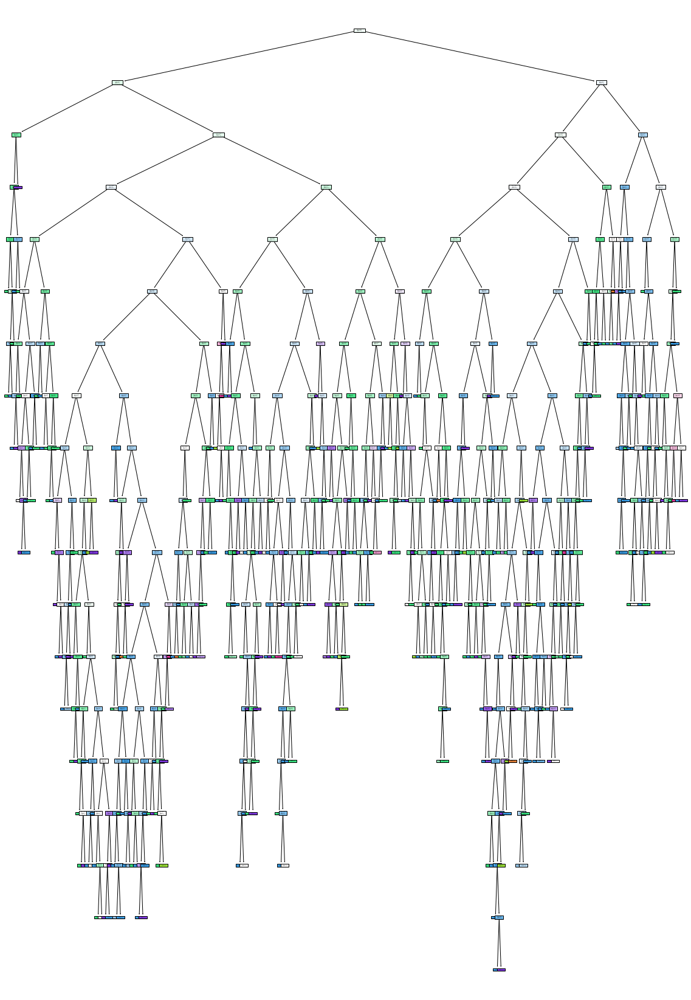

In [473]:
plt.figure(figsize=(20,30))
tree.plot_tree(rf.estimators_[0],filled=True)

[Text(579.3727580063215, 1595.3478260869565, 'X[10] <= 9.65\ngini = 0.647\nsamples = 752\nvalue = [9, 42, 491, 489, 160, 8]'),
 Text(193.69130188454199, 1524.4434782608696, 'X[8] <= 3.525\ngini = 0.658\nsamples = 242\nvalue = [4, 12, 176, 124, 65, 4]'),
 Text(140.9891758110687, 1453.5391304347827, 'X[5] <= 11.5\ngini = 0.665\nsamples = 236\nvalue = [4, 12, 164, 123, 65, 4]'),
 Text(44.104007633587784, 1382.6347826086956, 'X[7] <= 0.997\ngini = 0.595\nsamples = 92\nvalue = [0, 2, 76, 38, 22, 0]'),
 Text(21.297709923664122, 1311.7304347826087, 'X[3] <= 2.15\ngini = 0.34\nsamples = 19\nvalue = [0, 1, 24, 4, 1, 0]'),
 Text(14.198473282442748, 1240.8260869565217, 'X[10] <= 9.55\ngini = 0.213\nsamples = 16\nvalue = [0, 1, 23, 1, 1, 0]'),
 Text(8.519083969465647, 1169.9217391304348, 'X[10] <= 9.25\ngini = 0.091\nsamples = 12\nvalue = [0, 0, 20, 1, 0, 0]'),
 Text(5.679389312977099, 1099.0173913043477, 'X[3] <= 1.85\ngini = 0.375\nsamples = 3\nvalue = [0, 0, 3, 1, 0, 0]'),
 Text(2.8396946564885

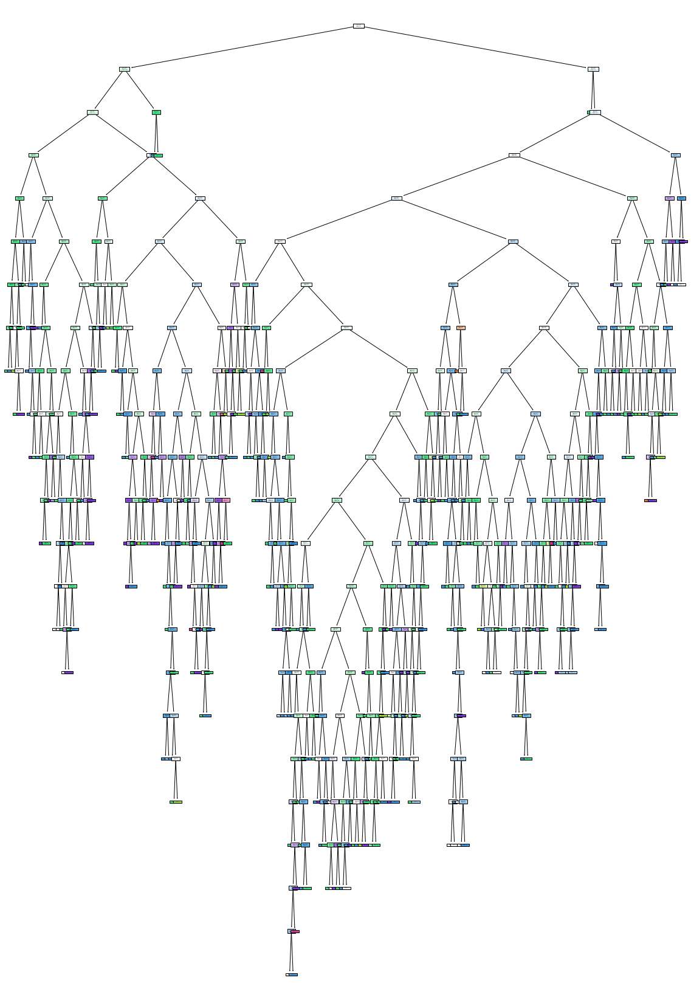

In [474]:
plt.figure(figsize=(20,30))
tree.plot_tree(rf.estimators_[1],filled=True)

In [475]:
#bagging(bootstrap)/sampling with replacement
#different tree structure for est 1 and est0  
#so they use different sub samples of dataset  but some overlap
#sampling of dataset  done by bootstrap is difficult understand so ignore it automatic

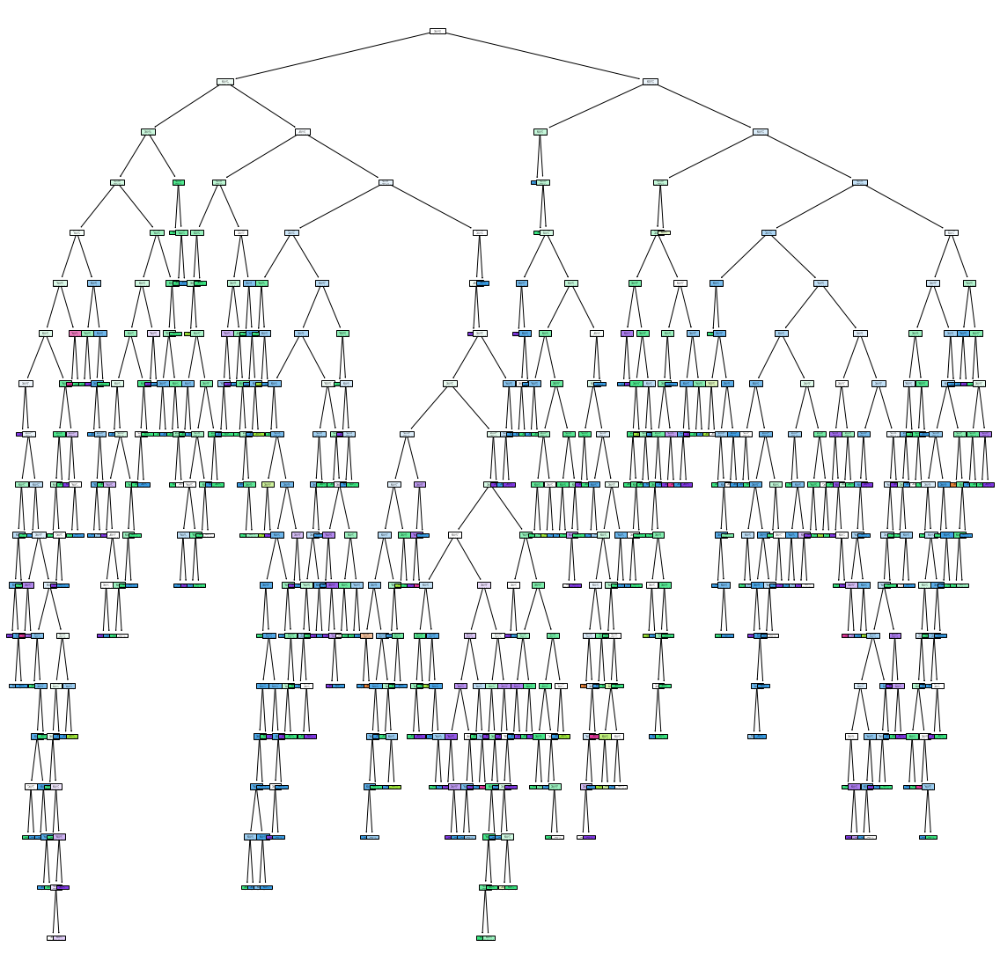

In [476]:
plt.figure(figsize=(20,20))
for i in range(len(rf.estimators_)):
    tree.plot_tree(rf.estimators_[i],filled=True)

In [499]:
grid_param={
    "n_estimators":[10],
    "criterion":['gini','entropy'],
    "max_depth":range(10),
    "min_samples_leaf":range(10)
}

In [500]:
rf=RandomForestClassifier(n_estimators=10)

In [501]:
grid_search_rf=GridSearchCV(param_grid=grid_param,cv=10,n_jobs=6,verbose=1,estimator=rf)#verbose is logging

In [502]:
grid_search_rf.fit(x_train,y_train)

Fitting 10 folds for each of 200 candidates, totalling 2000 fits


C:\Users\akshay\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:666: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(("The least populated class in y has only %d"
C:\Users\akshay\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:922: UserWarning: One or more of the test scores are non-finite: [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan 0.41117647
 0.40705182 0.39867647 0.40619748 0.4045098  0.40619048 0.3995028
 0.42202381 0.40612045        nan 0.38785014 0.38945378 0.40782913
 0.39281513 0.40869048 0.39533613 0.39535014 0.39281513 0.38285014
        nan 0.4044958  0.3994958  0.40535714 0.39954482 0.4062395
 0.40955182 0.39871148 0.41953081 0.39283613        nan 0.4095028
 0.38115546 0.4119958  0.40701681 0.41204482 0.39203081 0.40701681
 0.41284314 0.39614846        nan 0.39453782 0.40285014 0.42782913
 0.39619048 0.4

GridSearchCV(cv=10, estimator=RandomForestClassifier(n_estimators=10), n_jobs=6,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(0, 10),
                         'min_samples_leaf': range(0, 10),
                         'n_estimators': [10]},
             verbose=1)

In [503]:
grid_search_rf.best_params_

{'criterion': 'gini',
 'max_depth': 7,
 'min_samples_leaf': 2,
 'n_estimators': 10}

In [504]:
rf_new=RandomForestClassifier(criterion='entropy',max_depth=9,min_samples_leaf=1,n_estimators=120)

In [505]:
rf_new.fit(x_train,y_train)

RandomForestClassifier(criterion='entropy', max_depth=9, n_estimators=120)

In [506]:
rf_new.score(x_test,y_test)

0.445

[Text(699.4115975935829, 1032.8400000000001, 'X[3] <= 4.45\nentropy = 1.766\nsamples = 751\nvalue = [8, 38, 480, 479, 174, 20]'),
 Text(382.0397727272727, 924.1200000000001, 'X[4] <= 0.071\nentropy = 1.727\nsamples = 704\nvalue = [6, 29, 466, 443, 151, 20]'),
 Text(201.79010695187165, 815.4000000000001, 'X[2] <= 0.07\nentropy = 1.544\nsamples = 181\nvalue = [2, 8, 118, 144, 21, 2]'),
 Text(92.50267379679144, 706.6800000000001, 'X[6] <= 59.5\nentropy = 1.289\nsamples = 45\nvalue = [2, 0, 40, 29, 2, 0]'),
 Text(59.67914438502674, 597.96, 'X[3] <= 1.95\nentropy = 1.162\nsamples = 38\nvalue = [2, 0, 34, 27, 0, 0]'),
 Text(29.83957219251337, 489.24, 'X[4] <= 0.06\nentropy = 1.297\nsamples = 17\nvalue = [2, 0, 11, 14, 0, 0]'),
 Text(17.90374331550802, 380.5200000000001, 'X[9] <= 0.845\nentropy = 0.946\nsamples = 8\nvalue = [1, 0, 11, 2, 0, 0]'),
 Text(11.935828877005347, 271.80000000000007, 'X[4] <= 0.05\nentropy = 0.414\nsamples = 7\nvalue = [1, 0, 11, 0, 0, 0]'),
 Text(5.967914438502674, 1

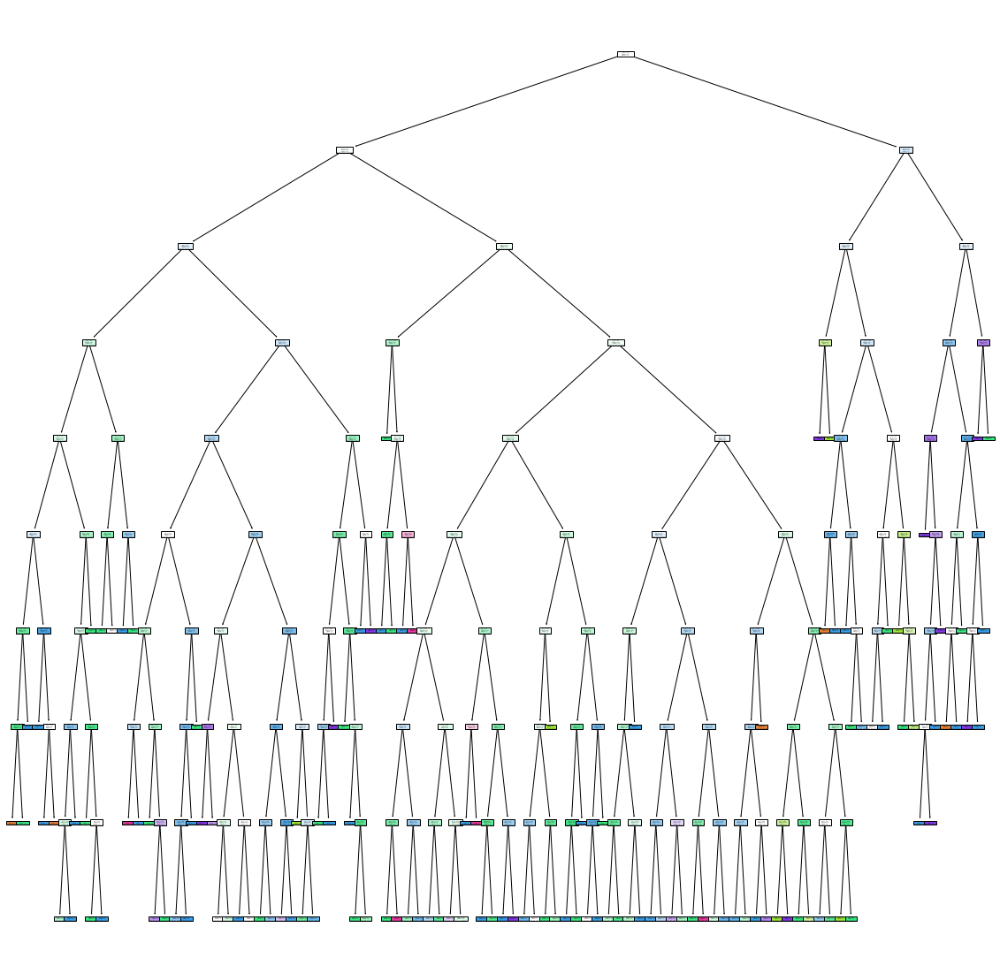

In [507]:
plt.figure(figsize=(20,20))
tree.plot_tree(rf_new.estimators_[0],filled=True)

In [ ]:
#there is no hard and fast rule to get best accuracy in ml otherwise any software engg can do this uve to do experiment
#thats why new algorithm are design and new reseach paper are released

# knn


In [533]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.25,random_state=300)

In [534]:
knn=KNeighborsClassifier() 
#by default 5 neighbors that is k=5
#which means for new data set it will calculate dist from all data but takes 5 minimum from them 

In [535]:
knn.fit(x_train,y_train)

KNeighborsClassifier()

In [536]:
knn.score(x_test,y_test) #bad accuracy

0.49

finding best parameter to get accuracy i,e hyperparameter tunning

In [563]:
#giving set of value for hyper parameter from kneighbor algorithm which is to be control
param={
    'n_neighbors':[3,5,7,9,12,15,17,21],
    'leaf_size':[5,10,15,30,40,50],
    'p':[1,2],
    'weights':['uniform', 'distance']
}

In [564]:
grid_cv=GridSearchCV(knn,param_grid=param)

In [565]:
grid_cv.fit(x_train,y_train)

GridSearchCV(estimator=KNeighborsClassifier(n_neighbors=21, p=1),
             param_grid={'leaf_size': [5, 10, 15, 30, 40, 50],
                         'n_neighbors': [3, 5, 7, 9, 12, 15, 17, 21],
                         'p': [1, 2], 'weights': ['uniform', 'distance']})

In [566]:
grid_cv.best_params_

{'leaf_size': 5, 'n_neighbors': 21, 'p': 1, 'weights': 'distance'}

In [567]:
knn=KNeighborsClassifier(n_neighbors= 12,p=1,n_jobs=-1) 

In [568]:
knn.fit(x_train,y_train)

KNeighborsClassifier(n_jobs=-1, n_neighbors=12, p=1)

In [569]:
knn.score(x_test,y_test) #minute accuracy change is also good if it is huge then check

0.5075

In [570]:
knn=KNeighborsClassifier(n_neighbors=21,p=1)

In [571]:
knn.fit(x_train,y_train)

KNeighborsClassifier(n_neighbors=21, p=1)

In [572]:
knn.score(x_test,y_test)

0.5325

even after hyper parameter tunning we can improve result by changing parameter outside the given set of parameter

# Experiments


In [600]:
knn=KNeighborsClassifier(n_neighbors=20,p=1) 

In [601]:
knn.fit(x_train,y_train)

KNeighborsClassifier(n_neighbors=20, p=1)

In [602]:
knn.score(x_test,y_test)

0.535

In [595]:
knn=KNeighborsClassifier(n_neighbors=18,p=1)

In [596]:
knn.fit(x_train,y_train)

KNeighborsClassifier(n_neighbors=18, p=1)

In [597]:
knn.score(x_test,y_test)

0.5425

In [598]:
knn=KNeighborsClassifier(n_neighbors=19,p=1)

In [599]:
knn.fit(x_train,y_train)

KNeighborsClassifier(n_neighbors=19, p=1)

In [584]:
knn.score(x_test,y_test)

0.535

In [603]:
import pickle
pickle.dump(knn,open("knn.pkl","wb")) #wb=write binary

In [604]:
pwd

'C:\\Users\\akshay'

In [605]:
ls

 Volume in drive C is OS
 Volume Serial Number is 0C52-6CB9

 Directory of C:\Users\akshay

08-02-2023  12:22 PM    <DIR>          .
30-09-2022  09:41 PM    <DIR>          ..
08-05-2022  09:35 AM    <DIR>          .anaconda
08-02-2023  12:22 PM    <DIR>          .conda
24-12-2022  11:53 AM                25 .condarc
20-04-2022  01:20 PM    <DIR>          .continuum
04-02-2023  04:08 PM    <DIR>          .cufflinks
19-01-2023  06:27 PM                53 .git-for-windows-updater
06-02-2023  09:32 PM    <DIR>          .ipynb_checkpoints
23-04-2022  09:58 AM    <DIR>          .ipython
08-01-2023  10:15 PM    <DIR>          .jupyter
08-05-2022  12:39 PM    <DIR>          .matplotlib
08-01-2023  11:04 PM    <DIR>          .spyder-py3
18-09-2022  05:05 PM    <DIR>          .vscode
04-01-2023  07:37 PM    <DIR>          __pycache__
25-05-2021  10:54 AM    <DIR>          3D Objects
07-01-2023  11:02 AM                54 abc.log
03-02-2023  03:52 PM               589 admisiion_lr_model.pickle
22

In [606]:
#knn.pkl size is larger than wine quality dataset which proves it takes whole dataset 

In [607]:
knn.predict(x_test) #predict gives output values for 

array([6, 5, 5, 5, 5, 6, 6, 6, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 5, 5, 6,
       5, 5, 6, 6, 6, 5, 6, 5, 5, 7, 6, 5, 6, 5, 5, 5, 5, 5, 5, 6, 6, 5,
       7, 5, 5, 5, 6, 6, 6, 5, 7, 5, 6, 5, 7, 5, 6, 5, 6, 6, 6, 6, 6, 6,
       5, 5, 6, 5, 6, 5, 6, 6, 5, 5, 6, 5, 6, 5, 5, 5, 6, 5, 6, 5, 5, 5,
       6, 6, 5, 5, 5, 6, 5, 6, 6, 5, 5, 6, 5, 5, 6, 5, 5, 6, 6, 5, 6, 6,
       6, 5, 6, 5, 5, 6, 6, 5, 5, 6, 5, 6, 6, 7, 5, 7, 5, 6, 5, 6, 5, 5,
       6, 5, 5, 5, 6, 6, 5, 5, 6, 5, 6, 5, 6, 6, 6, 6, 6, 5, 6, 6, 6, 6,
       6, 5, 6, 5, 5, 7, 5, 5, 6, 6, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 5, 6,
       6, 5, 5, 5, 6, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 5, 6, 5, 6, 5, 6, 6,
       6, 5, 6, 6, 5, 5, 6, 6, 5, 5, 6, 5, 5, 5, 6, 5, 5, 5, 6, 6, 5, 6,
       5, 5, 5, 6, 5, 5, 5, 5, 5, 5, 5, 6, 5, 6, 6, 5, 5, 5, 6, 6, 5, 5,
       5, 5, 6, 6, 5, 5, 5, 6, 6, 5, 5, 6, 5, 5, 6, 5, 6, 7, 6, 5, 6, 5,
       6, 6, 5, 5, 7, 5, 5, 6, 5, 6, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 6, 5,
       5, 6, 6, 6, 5, 5, 6, 5, 6, 6, 5, 5, 5, 5, 5,

In [608]:
len(knn.predict(x_test))

400

In [609]:
x_test

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
755,7.8,0.910,0.07,1.90,0.058,22.0,47.0,0.99525,3.51,0.43,10.70
999,6.4,0.690,0.00,1.65,0.055,7.0,12.0,0.99162,3.47,0.53,12.90
1521,6.9,0.480,0.20,1.90,0.082,9.0,23.0,0.99585,3.39,0.43,9.05
24,6.9,0.400,0.14,2.40,0.085,21.0,40.0,0.99680,3.43,0.63,9.70
47,8.7,0.290,0.52,1.60,0.113,12.0,37.0,0.99690,3.25,0.58,9.50
...,...,...,...,...,...,...,...,...,...,...,...
258,7.7,0.410,0.76,1.80,0.611,8.0,45.0,0.99680,3.06,1.26,9.40
317,9.6,0.770,0.12,2.90,0.082,30.0,74.0,0.99865,3.30,0.64,10.40
430,10.5,0.240,0.47,2.10,0.066,6.0,24.0,0.99780,3.15,0.90,11.00
1483,8.1,0.330,0.44,1.50,0.042,6.0,12.0,0.99542,3.35,0.61,10.70


In [613]:
#for 24th dataset in actual data it is 6 but here 5
#for 47th dataset is same in both
#this happens because our accuracy is 54%

# svm


In [41]:
from sklearn.svm import SVC

In [42]:
svc=SVC()

In [43]:
svc.fit(x_train,y_train)

ValueError: Unknown label type: 'continuous'

In [44]:
svc.score(x_test,y_test)

AttributeError: 'SVC' object has no attribute 'shape_fit_'

In [45]:
param={
    "kernel":['linear', 'poly', 'rbf', 'sigmoid']
    
}

In [627]:
svm_grid=GridSearchCV(svc,param_grid=param)

In [628]:
svm_grid.fit(x_train,y_train)

GridSearchCV(estimator=SVC(),
             param_grid={'kernel': ['linear', 'poly', 'rbf', 'sigmoid']})

In [629]:
svm_grid.best_params_

{'kernel': 'linear'}

In [630]:
svc1=SVC(kernel='linear')

In [631]:
svc1.fit(x_train,y_train)

SVC(kernel='linear')

In [632]:
svc1.score(x_test,y_test)

0.555

In [634]:
svc2=SVC(kernel='poly')


In [635]:
svc2.fit(x_train,y_train)

SVC(kernel='poly')

In [636]:
svc2.score(x_test,y_test)

0.4525

In [660]:
param={
    "kernel":['linear', 'poly', 'rbf', 'sigmoid'],
    "gamma":[.001,.1,.4,.002,.003]
}

In [661]:
svm_grid1=GridSearchCV(svc,param_grid=param,verbose=3)

In [ ]:
svm_grid1.fit(x_train,y_train)

In [ ]:
#it takes alot of time 

# svm.svr

In [3]:
df=pd.read_csv(r"C:\Users\akshay\Downloads\Admission_Prediction.csv")

In [5]:
df

,Serial No.,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit
0,1,337.0,118.0,4.0,4.5,4.5,9.65,1,0.92
1,2,324.0,107.0,4.0,4.0,4.5,8.87,1,0.76
2,3,NaN,104.0,3.0,3.0,3.5,8.00,1,0.72
3,4,322.0,110.0,3.0,3.5,2.5,8.67,1,0.80
4,5,314.0,103.0,2.0,2.0,3.0,8.21,0,0.65
...,...,...,...,...,...,...,...,...,...
495,496,332.0,108.0,5.0,4.5,4.0,9.02,1,0.87
496,497,337.0,117.0,5.0,5.0,5.0,9.87,1,0.96
497,498,330.0,120.0,5.0,4.5,5.0,9.56,1,0.93
498,499,312.0,103.0,4.0,4.0,5.0,8.43,0,0.73


In [48]:
df.isna().sum()

Serial No.           0
GRE Score            0
TOEFL Score          0
University Rating    0
SOP                  0
LOR                  0
CGPA                 0
Research             0
Chance of Admit      0
dtype: int64

In [8]:
df['GRE Score']=df['GRE Score'].fillna(df['GRE Score'].mean())

In [11]:
df['TOEFL Score']=df['TOEFL Score'].fillna(df['TOEFL Score'].mean())

In [12]:
df['University Rating']=df['University Rating'].fillna(df['University Rating'].mean())

In [14]:
x=df.drop(['Serial No.','Chance of Admit'],axis=1)

In [17]:
y=df['Chance of Admit']

In [18]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.25,random_state=200)

In [19]:
from sklearn.svm import SVR


In [20]:
svr=SVR()

In [21]:
svr.fit(x_train,y_train)

SVR()

In [22]:
svr.score(x_test,y_test)

0.6913659939646668

In [23]:
from sklearn.metrics import r2_score

In [24]:
r2_score(y_test,svr.predict(x_test))

0.6913659939646668

In [26]:
svr.predict(x_test)

array([0.65123822, 0.7039083 , 0.5858618 , 0.58472256, 0.82614069,
       0.66908813, 0.73453451, 0.68888496, 0.78966498, 0.6325469 ,
       0.57769703, 0.57557624, 0.79863641, 0.63345596, 0.80472807,
       0.78472926, 0.83352035, 0.69077157, 0.76026923, 0.5565578 ,
       0.80629472, 0.73141141, 0.57559417, 0.66282788, 0.75825747,
       0.6674646 , 0.87837738, 0.67263511, 0.69908871, 0.60054061,
       0.7247963 , 0.61664498, 0.75212666, 0.83731384, 0.76361774,
       0.61819955, 0.7571052 , 0.64893484, 0.82201535, 0.66435963,
       0.76922286, 0.886986  , 0.62467587, 0.68626555, 0.69785944,
       0.6677885 , 0.63883743, 0.66808488, 0.52443053, 0.71494548,
       0.68441572, 0.83612133, 0.77415   , 0.87691493, 0.75029175,
       0.61925307, 0.80174667, 0.57373893, 0.63103327, 0.6991127 ,
       0.8007659 , 0.55563392, 0.82708676, 0.66173362, 0.67228623,
       0.67569288, 0.58956878, 0.76933774, 0.68143241, 0.79143501,
       0.7877443 , 0.78626778, 0.76404984, 0.60121734, 0.82371

In [27]:
df.iloc[0]

Serial No.             1.00
GRE Score            337.00
TOEFL Score          118.00
University Rating      4.00
SOP                    4.50
LOR                    4.50
CGPA                   9.65
Research               1.00
Chance of Admit        0.92
Name: 0, dtype: float64

In [28]:
svr.predict([x.iloc[0]])

array([0.88352555])

In [29]:
y[0]

0.92

In [30]:
svr.score(x_test,y_test)

0.6913659939646668

In [ ]:
svc.score()

In [ ]:
#score is genralised func which can be used for any module but there internal opeartion is diff

# stacking

In [52]:
import pandas as pd
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

In [53]:
data=pd.read_csv(r'C:\Users\akshay\Downloads\winequality_red.csv')

In [54]:
data

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [55]:
x=data.drop(columns='quality')
y=data.quality

In [65]:
train,val_train,test,val_test=train_test_split(x,y,test_size=0.50,random_state=30)

In [66]:
x_train,x_test,y_train,y_test=train_test_split(train,test,random_state=30,test_size=0.15)

In [67]:
knn=KNeighborsClassifier()

In [68]:
knn.fit(x_train,y_train)

KNeighborsClassifier()

In [69]:
knn.score(x_test,y_test)

0.5833333333333334

In [70]:
svc=SVC()

In [71]:
svc.fit(x_train,y_train)

SVC()

In [72]:
svc.score(x_test,y_test)

0.5083333333333333

In [73]:
prediction_knn=knn.predict(val_train)

In [75]:
prediction_svc=svc.predict(val_train)

In [76]:
prediction_knn

array([7, 5, 6, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 5, 5, 6, 5, 5, 6, 5, 5, 6,
       5, 5, 6, 6, 6, 5, 5, 6, 5, 6, 6, 5, 6, 6, 6, 6, 5, 7, 6, 6, 5, 5,
       6, 7, 6, 6, 5, 6, 5, 5, 5, 6, 5, 5, 6, 6, 5, 5, 6, 5, 5, 6, 5, 5,
       6, 6, 5, 4, 5, 5, 5, 6, 6, 6, 7, 5, 5, 6, 6, 6, 7, 6, 5, 5, 5, 6,
       5, 5, 5, 7, 6, 6, 6, 7, 5, 6, 5, 5, 5, 6, 5, 7, 6, 5, 6, 5, 7, 5,
       5, 5, 5, 5, 6, 6, 6, 6, 6, 5, 6, 6, 7, 6, 5, 5, 6, 5, 5, 6, 6, 5,
       5, 6, 7, 5, 6, 5, 6, 6, 5, 5, 6, 5, 5, 5, 5, 5, 6, 7, 5, 5, 5, 5,
       6, 5, 6, 5, 5, 5, 5, 6, 6, 5, 6, 5, 6, 6, 6, 6, 6, 5, 6, 5, 6, 5,
       6, 5, 5, 6, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 5, 5, 6, 5, 6, 5, 6, 5,
       5, 6, 6, 5, 6, 5, 5, 6, 6, 6, 6, 5, 6, 5, 5, 6, 5, 4, 5, 6, 7, 5,
       6, 6, 5, 6, 6, 6, 6, 6, 6, 5, 5, 5, 6, 5, 5, 6, 5, 5, 5, 6, 5, 6,
       5, 6, 5, 6, 6, 5, 6, 5, 5, 6, 5, 6, 6, 5, 6, 6, 5, 6, 6, 5, 6, 6,
       5, 5, 6, 6, 6, 6, 5, 6, 6, 5, 5, 6, 5, 6, 5, 6, 5, 6, 6, 5, 6, 6,
       7, 5, 6, 7, 5, 4, 6, 7, 5, 5, 6, 5, 5, 6, 5,

In [77]:
prediction_svc

array([6, 6, 6, 6, 6, 5, 6, 5, 5, 5, 6, 5, 6, 6, 5, 6, 6, 5, 6, 5, 6, 6,
       6, 5, 6, 6, 6, 6, 6, 6, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 5, 6, 6, 6,
       6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 5, 5, 6, 5, 5, 6, 5, 6, 6, 5, 5,
       6, 6, 5, 6, 5, 5, 6, 6, 6, 6, 6, 5, 6, 6, 6, 6, 6, 6, 5, 6, 5, 6,
       5, 6, 5, 6, 5, 6, 6, 6, 5, 6, 5, 6, 5, 6, 6, 6, 6, 6, 6, 5, 6, 5,
       5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 5, 6, 6, 6, 5, 5, 5,
       6, 6, 6, 6, 6, 6, 6, 6, 6, 5, 6, 5, 6, 5, 6, 6, 6, 6, 5, 5, 6, 6,
       6, 6, 6, 6, 6, 6, 5, 6, 5, 5, 6, 5, 6, 6, 6, 6, 6, 5, 6, 6, 6, 6,
       5, 5, 6, 6, 5, 6, 6, 5, 5, 6, 6, 6, 5, 6, 5, 6, 6, 5, 6, 6, 6, 5,
       6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 5, 5, 5, 6, 6, 5,
       6, 6, 5, 6, 6, 6, 6, 5, 6, 6, 6, 6, 6, 6, 6, 6, 5, 6, 6, 6, 5, 6,
       6, 6, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 5, 6, 5, 6, 6, 5, 6, 6,
       6, 5, 6, 5, 6, 6, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 5, 6, 6, 6, 6,
       6, 6, 5, 6, 5, 6, 6, 6, 6, 6, 5, 5, 5, 6, 5,

In [85]:
input3=np.column_stack((prediction_knn,prediction_knn))

In [86]:
output=val_test

In [87]:
output

1147    7
659     4
871     5
1333    5
1411    6
       ..
1073    6
200     7
942     7
1106    6
1329    6
Name: quality, Length: 800, dtype: int64

In [88]:
pd.DataFrame(input3)

,0,1
0,7,7
1,5,5
2,6,6
3,5,5
4,5,5
...,...,...
795,5,5
796,5,5
797,6,6
798,6,6


In [89]:
rf=RandomForestClassifier()

In [90]:
rf.fit(input3,output)

RandomForestClassifier()

In [91]:
rf.score(x_test,y_test)

ValueError: X has 11 features, but DecisionTreeClassifier is expecting 2 features as input.

In [92]:
knn_ouput=knn.predict(x_test)
svc_output=svc.predict(x_test)

In [93]:
output_for_stack1=np.column_stack((knn_ouput,svc_output))

In [94]:
rf.predict(output_for_stack1)

array([5, 6, 5, 5, 6, 6, 5, 6, 6, 5, 6, 5, 5, 5, 6, 6, 6, 5, 5, 6, 5, 6,
       6, 5, 5, 5, 6, 6, 5, 5, 6, 5, 6, 5, 6, 6, 5, 5, 6, 5, 5, 6, 5, 5,
       6, 6, 5, 5, 6, 5, 6, 5, 6, 5, 6, 6, 5, 6, 6, 5, 5, 5, 5, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 6, 6, 6, 6, 5, 5, 5, 6, 6, 5, 6, 5, 6, 6, 5,
       6, 6, 5, 5, 6, 5, 5, 6, 6, 5, 5, 5, 5, 6, 5, 5, 6, 5, 5, 6, 5, 5,
       5, 6, 6, 5, 5, 5, 5, 6, 5, 5], dtype=int64)

In [97]:
rf.score(output_for_stack1,y_test)

0.5916666666666667

In [98]:
val_test

1147    7
659     4
871     5
1333    5
1411    6
       ..
1073    6
200     7
942     7
1106    6
1329    6
Name: quality, Length: 800, dtype: int64

In [99]:
val_train

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
1147,10.0,0.410,0.45,6.2,0.071,6.0,14.0,0.99702,3.21,0.49,11.8
659,7.1,0.840,0.02,4.4,0.096,5.0,13.0,0.99700,3.41,0.57,11.0
871,6.9,0.560,0.03,1.5,0.086,36.0,46.0,0.99522,3.53,0.57,10.6
1333,9.1,0.775,0.22,2.2,0.079,12.0,48.0,0.99760,3.18,0.51,9.6
1411,6.4,0.470,0.40,2.4,0.071,8.0,19.0,0.99630,3.56,0.73,10.6
...,...,...,...,...,...,...,...,...,...,...,...
1073,8.0,0.620,0.33,2.7,0.088,16.0,37.0,0.99720,3.31,0.58,10.7
200,9.6,0.320,0.47,1.4,0.056,9.0,24.0,0.99695,3.22,0.82,10.3
942,10.1,0.430,0.40,2.6,0.092,13.0,52.0,0.99834,3.22,0.64,10.0
1106,8.2,0.230,0.42,1.9,0.069,9.0,17.0,0.99376,3.21,0.54,12.3
